<a href="https://colab.research.google.com/github/TruongVanDuc19146177/AI/blob/main/fruit.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [15]:
#ket noi voi drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [16]:
# Khai báo và sử dụng các thư viện sau
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import os
import numpy as np
import tensorflow as tf
from keras.utils import np_utils
from keras.models import Sequential
from keras.layers import Dense, Activation, Dropout, Conv2D, MaxPooling2D, Flatten
from tensorflow.keras.optimizers import SGD, RMSprop
from keras.callbacks import EarlyStopping, ModelCheckpoint
from sklearn.utils import validation 
from sklearn import preprocessing
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.models import load_model
from tensorflow.keras.utils import load_img, img_to_array
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [17]:
%cd /content/drive/MyDrive/dataAI


/content/drive/MyDrive/dataAI


In [19]:
# Tạo ra class ImageDataGenerator để chỉnh sửa ảnh 
train_datagen=ImageDataGenerator(rescale=1./255, shear_range=0.2, zoom_range=0.2, horizontal_flip=True)

In [20]:
# Tạo bộ dữ liệu training set
training_set=train_datagen.flow_from_directory('/content/drive/MyDrive/dataAI/fruit/train',target_size=(150,150), batch_size=32, class_mode='categorical')

# Tạo bộ dữ liệu validation
validation=train_datagen.flow_from_directory('/content/drive/MyDrive/dataAI/fruit/validation',target_size=(150,150), batch_size=32, class_mode='categorical')

# Các nhãn có trong bộ dữ liệu training set
validation.class_indices

Found 659 images belonging to 10 classes.
Found 97 images belonging to 10 classes.


{'apple': 0,
 'banana': 1,
 'carrot': 2,
 'corn': 3,
 'cucumber': 4,
 'kiwi': 5,
 'orange': 6,
 'pear': 7,
 'sweetpotato': 8,
 'watermelon': 9}

In [21]:
# Tạo ra mạng CNN để train mô hình
model=Sequential()
model.add(Conv2D(32,(3,3), activation='relu', kernel_initializer='he_uniform', padding='same',input_shape=(150,150,3))) 
model.add(Conv2D(32,(3,3), activation='relu', kernel_initializer='he_uniform', padding='same'))
model.add(MaxPooling2D(2,2))
model.add(Conv2D(64,(3,3), activation='relu', kernel_initializer='he_uniform', padding='same')) 
model.add(Conv2D(64,(3,3), activation='relu', kernel_initializer='he_uniform', padding='same'))
model.add(MaxPooling2D(2,2))
model.add(Conv2D(128,(3,3), activation='relu', kernel_initializer='he_uniform', padding='same')) 
model.add(Conv2D(128,(3,3), activation='relu', kernel_initializer='he_uniform', padding='same'))
model.add(MaxPooling2D(2,2))
model.add(Flatten())
model.add(Dense(128,activation='relu',kernel_initializer='he_uniform'))
model.add(Dropout(0.2))
model.add(Dense(10,activation='softmax'))
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_12 (Conv2D)          (None, 150, 150, 32)      896       
                                                                 
 conv2d_13 (Conv2D)          (None, 150, 150, 32)      9248      
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 75, 75, 32)       0         
 2D)                                                             
                                                                 
 conv2d_14 (Conv2D)          (None, 75, 75, 64)        18496     
                                                                 
 conv2d_15 (Conv2D)          (None, 75, 75, 64)        36928     
                                                                 
 max_pooling2d_7 (MaxPooling  (None, 37, 37, 64)       0         
 2D)                                                  

In [22]:
 # Biên dịch 
model.compile(optimizer='adam',loss='categorical_crossentropy',metrics=['accuracy'])
# Gán biến lại để vẽ đồ thị, với 500 lần học (epochs), mỗi lần học thì chỉ học␣128 dữ liệu (batch_size), khi sai số không thay đổi trong 20 lần học thì sẽ␣ dừng học 
history=model.fit(training_set,epochs=500,batch_size=128,verbose=1, validation_data=validation, callbacks=[EarlyStopping(monitor='val_loss', patience=20)])

Epoch 1/500
 8/21 [==========>...................] - ETA: 4:57 - loss: 5.3254 - accuracy: 0.0820

/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


19/21 [==========================>...] - ETA: 42s - loss: 3.6091 - accuracy: 0.1025 

/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


21/21 [==============================] - 520s 25s/step - loss: 3.4789 - accuracy: 0.1047 - val_loss: 2.2392 - val_accuracy: 0.1546
Epoch 2/500
21/21 [==============================] - 35s 2s/step - loss: 2.2092 - accuracy: 0.1715 - val_loss: 2.1623 - val_accuracy: 0.2680
Epoch 3/500
21/21 [==============================] - 35s 2s/step - loss: 2.0610 - accuracy: 0.2352 - val_loss: 1.7495 - val_accuracy: 0.3505
Epoch 4/500
21/21 [==============================] - 35s 2s/step - loss: 1.9360 - accuracy: 0.2853 - val_loss: 1.5477 - val_accuracy: 0.4639
Epoch 5/500
21/21 [==============================] - 35s 2s/step - loss: 1.7382 - accuracy: 0.4006 - val_loss: 1.4682 - val_accuracy: 0.3814
Epoch 6/500
21/21 [==============================] - 35s 2s/step - loss: 1.6252 - accuracy: 0.4325 - val_loss: 1.0890 - val_accuracy: 0.6392
Epoch 7/500
21/21 [==============================] - 35s 2s/step - loss: 1.4340 - accuracy: 0.4947 - val_loss: 1.0075 - val_accuracy: 0.6289
Epoch 8/500
21/21 [====

In [23]:
# Đánh giá độ chính xác của mô hình 
Score=model.evaluate(training_set,verbose=0)
print('Train Loss', Score[0])
print('Train Accuracy', Score[1])

/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))
/usr/local/lib/python3.7/dist-packages/PIL/Image.py:960: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  "Palette images with Transparency expressed in bytes should be "


Train Loss 0.11996413767337799
Train Accuracy 0.9605462551116943


<function matplotlib.pyplot.show>

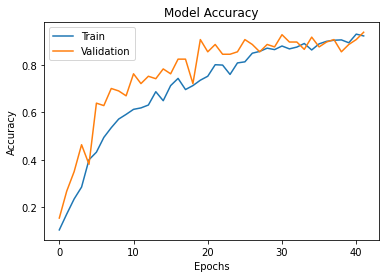

In [24]:
# Vẽ đồ thị giữa số lần học (Epochs) và độ chính xác (Accuracy)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epochs')
plt.legend(['Train','Validation'])
plt.show

In [28]:
 # Lưu lại
model.save("Fruit.h5")

In [31]:
# Tải mô hình 
model_CNN=load_model('/content/drive/MyDrive/dataAI/Fruit.h5')

pear-Qua LE


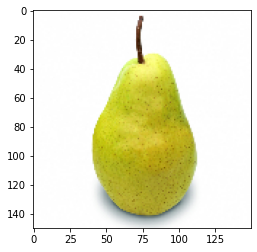

pear-Qua LE


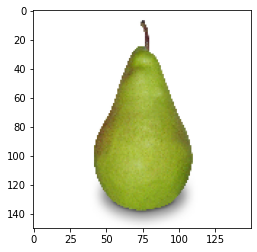

pear-Qua LE


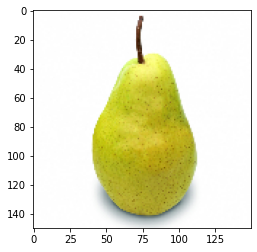

pear-Qua LE


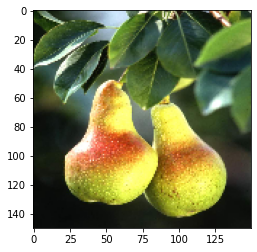

pear-Qua LE


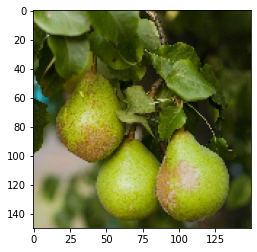

pear-Qua LE


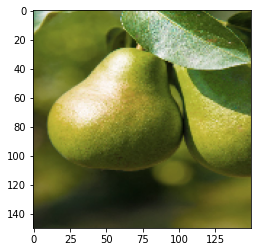

pear-Qua LE


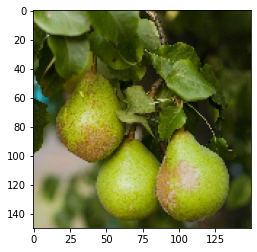

pear-Qua LE


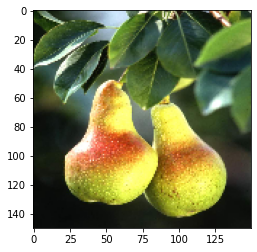

pear-Qua LE


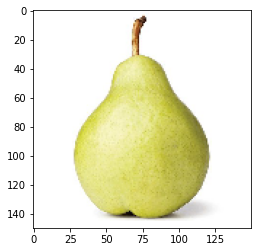

pear-Qua LE


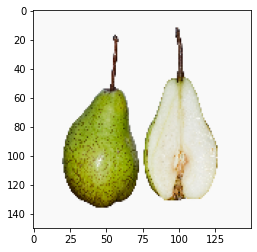

cucumber-Dua Chuot


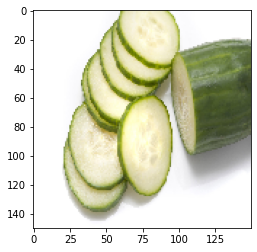

cucumber-Dua Chuot


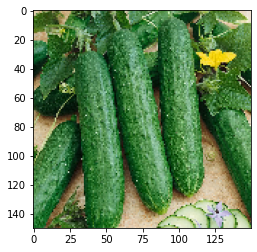

cucumber-Dua Chuot


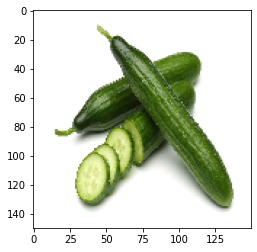

cucumber-Dua Chuot


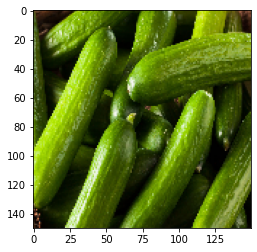

cucumber-Dua Chuot


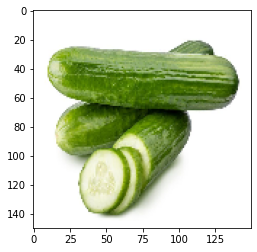

cucumber-Dua Chuot


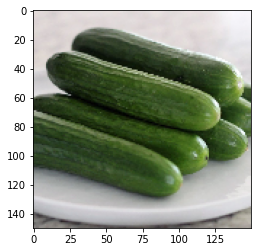

cucumber-Dua Chuot


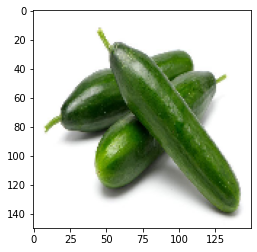

cucumber-Dua Chuot


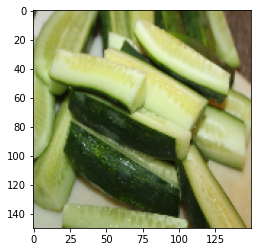

cucumber-Dua Chuot


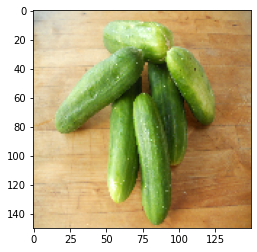

cucumber-Dua Chuot


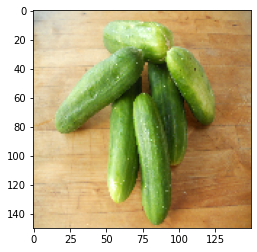

corn-Ngo


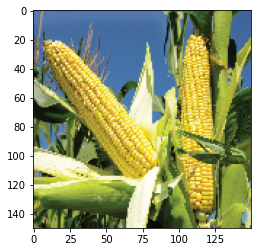

corn-Ngo


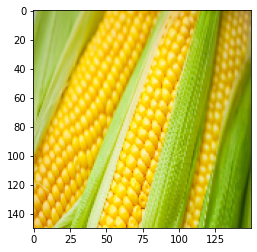

corn-Ngo


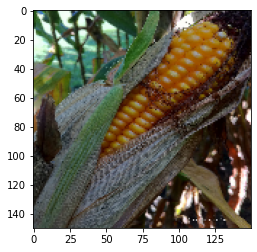

corn-Ngo


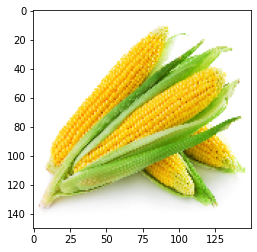

corn-Ngo


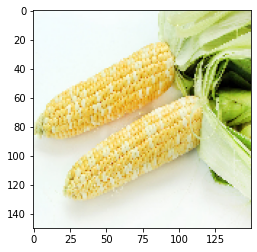

corn-Ngo


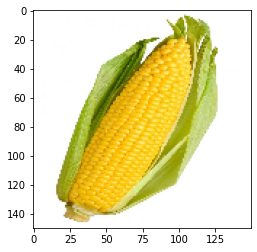

corn-Ngo


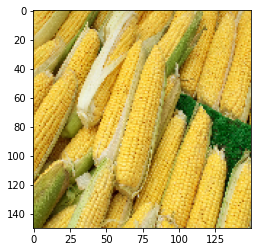

corn-Ngo


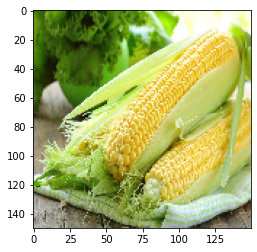

corn-Ngo


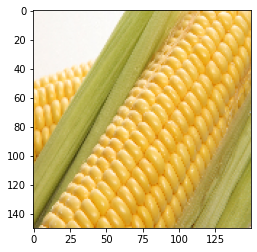

corn-Ngo


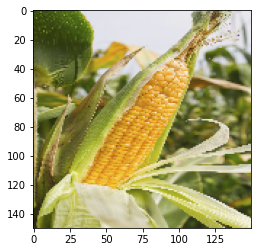

orange-Cam


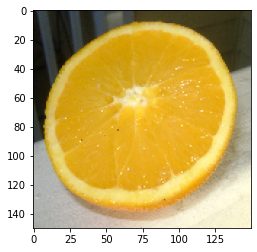

orange-Cam


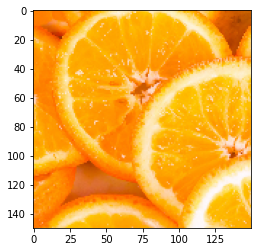

orange-Cam


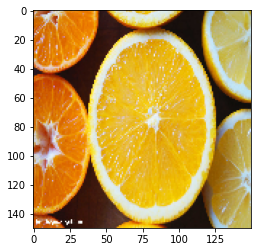

orange-Cam


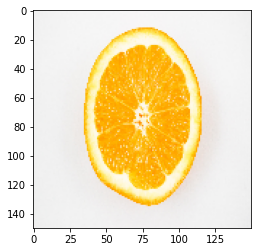

orange-Cam


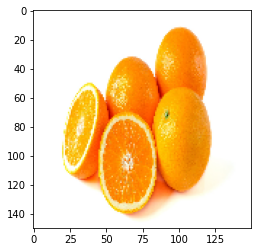

orange-Cam


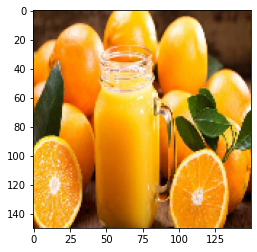

orange-Cam


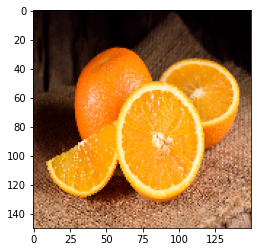

/usr/local/lib/python3.7/dist-packages/PIL/TiffImagePlugin.py:788: UserWarning: Corrupt EXIF data.  Expecting to read 4 bytes but only got 0. 
  warnings.warn(str(msg))


orange-Cam


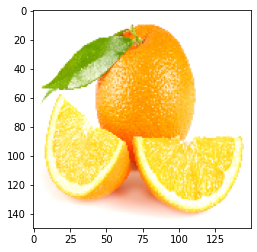

orange-Cam


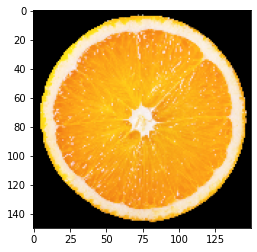

orange-Cam


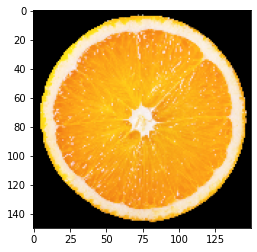

carrot-Ca Rot


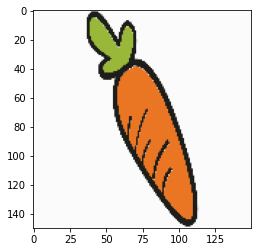

carrot-Ca Rot


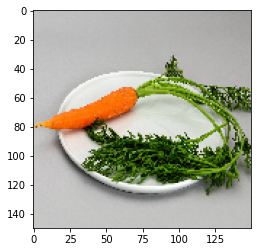

carrot-Ca Rot


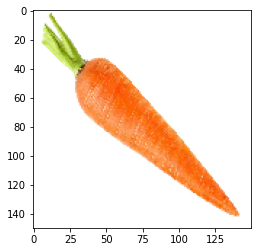

carrot-Ca Rot


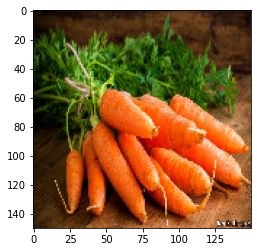

carrot-Ca Rot


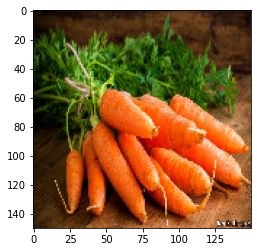

carrot-Ca Rot


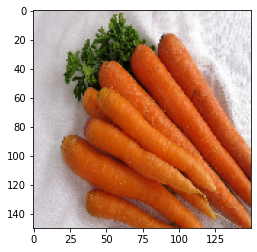

carrot-Ca Rot


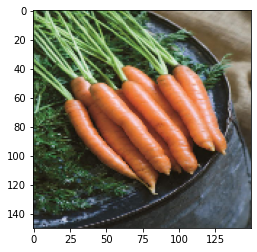

carrot-Ca Rot


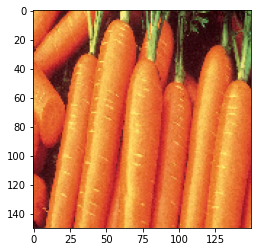

carrot-Ca Rot


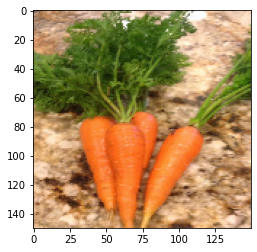

carrot-Ca Rot


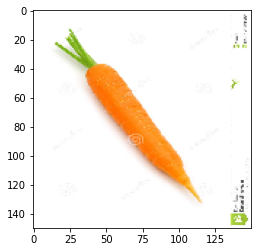

banana-Chuoi


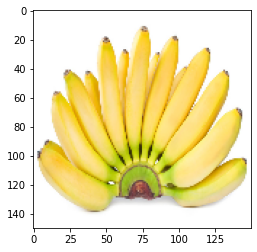

banana-Chuoi


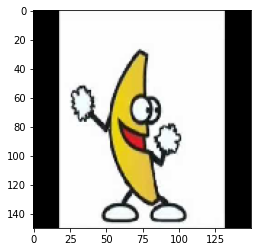

banana-Chuoi


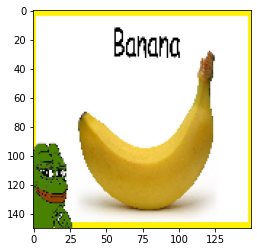

banana-Chuoi


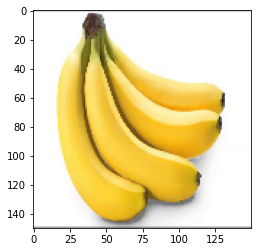

banana-Chuoi


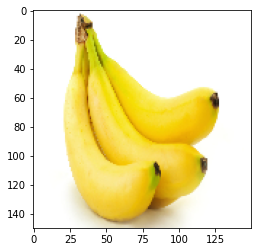

orange-Cam


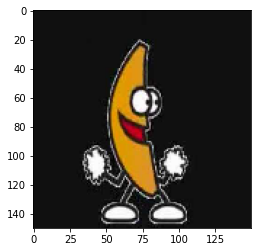

banana-Chuoi


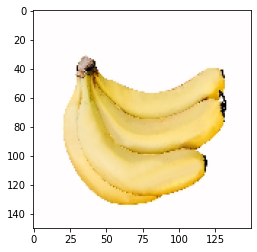

banana-Chuoi


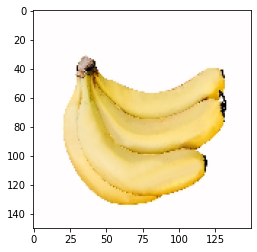

banana-Chuoi


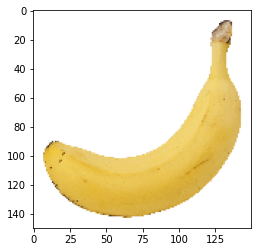

kiwi-Kiwi


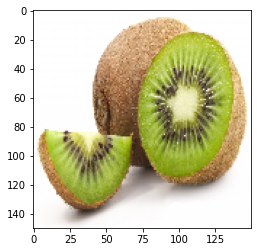

kiwi-Kiwi


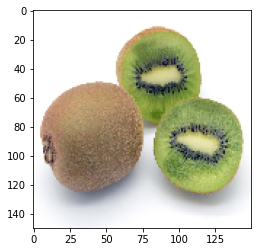

kiwi-Kiwi


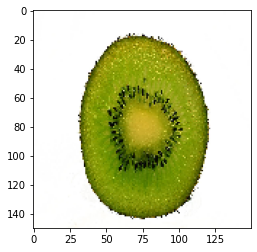

kiwi-Kiwi


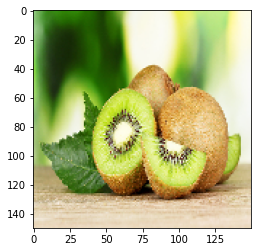

kiwi-Kiwi


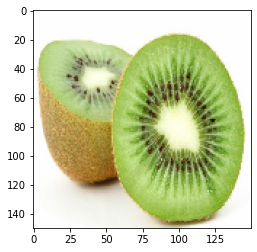

kiwi-Kiwi


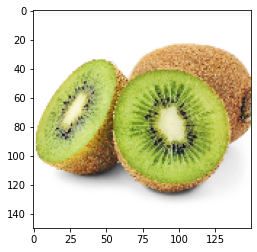

kiwi-Kiwi


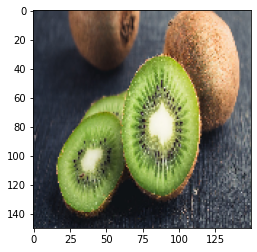

kiwi-Kiwi


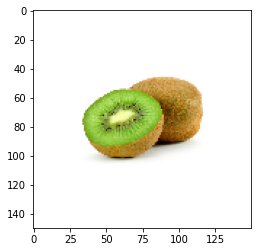

kiwi-Kiwi


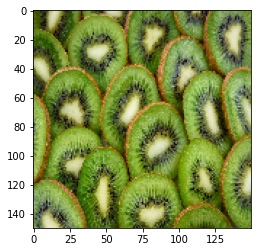

kiwi-Kiwi


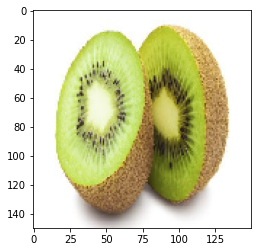

watermelon-Dua Hau


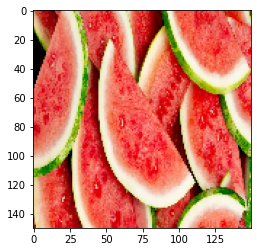

watermelon-Dua Hau


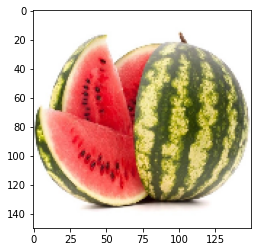

watermelon-Dua Hau


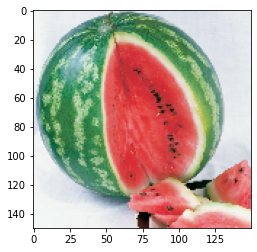

watermelon-Dua Hau


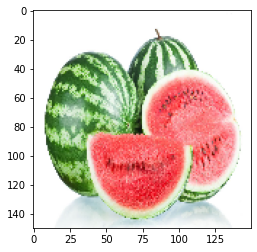

watermelon-Dua Hau


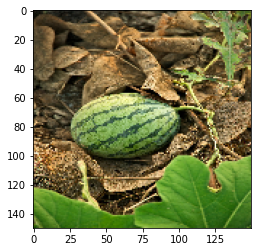

watermelon-Dua Hau


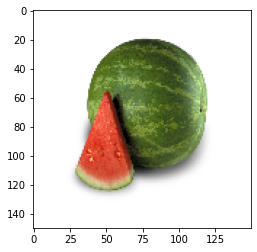

watermelon-Dua Hau


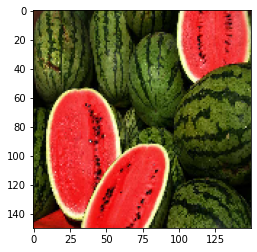

watermelon-Dua Hau


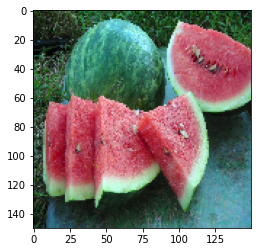

watermelon-Dua Hau


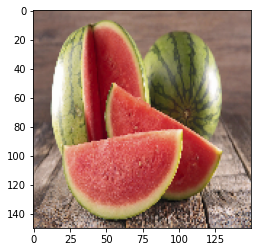

watermelon-Dua Hau


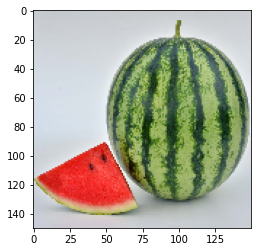

sweetpotato-Khoai Lang


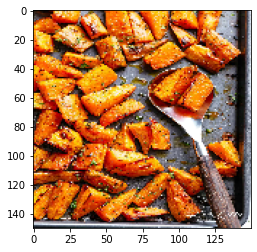

sweetpotato-Khoai Lang


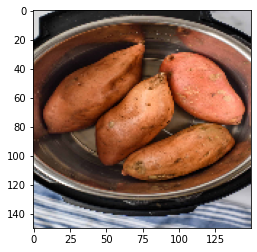

sweetpotato-Khoai Lang


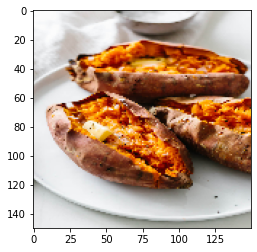

sweetpotato-Khoai Lang


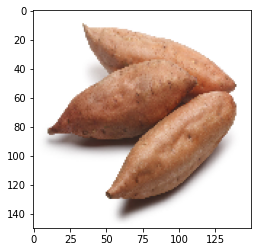

orange-Cam


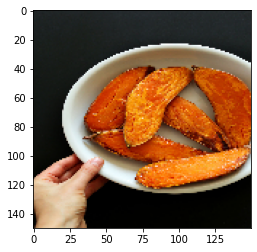

sweetpotato-Khoai Lang


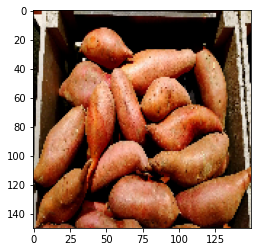

sweetpotato-Khoai Lang


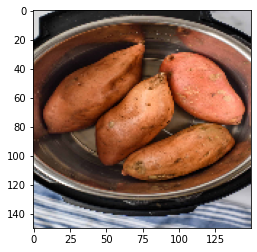

sweetpotato-Khoai Lang


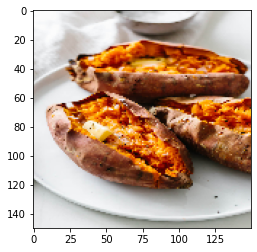

sweetpotato-Khoai Lang


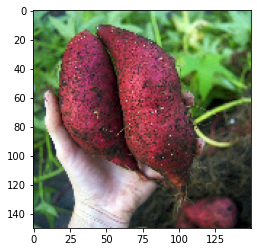

sweetpotato-Khoai Lang


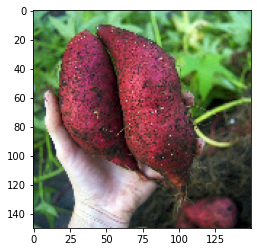

Apple-Tao


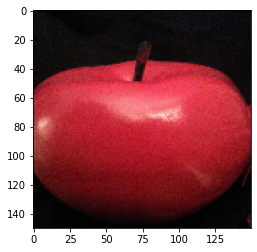

Apple-Tao


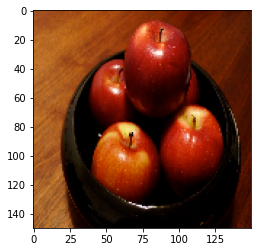

watermelon-Dua Hau


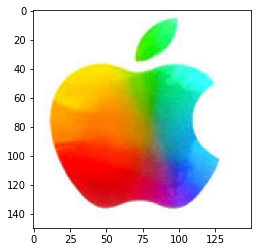

Apple-Tao


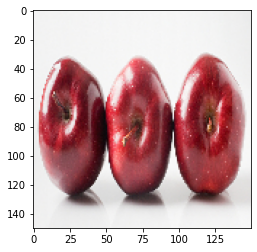

Apple-Tao


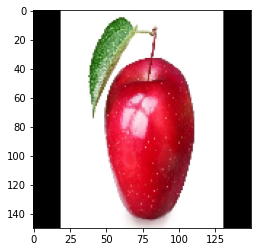

carrot-Ca Rot


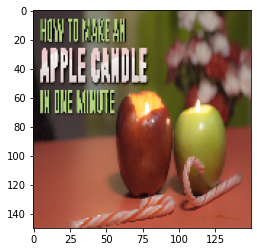

Apple-Tao


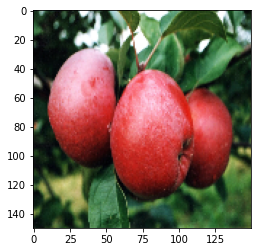

corn-Ngo


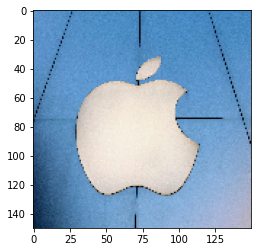

Apple-Tao


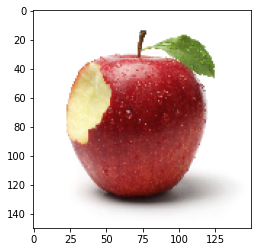

Apple-Tao


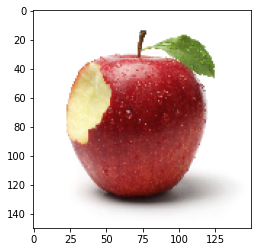

In [32]:
test="/content/drive/MyDrive/dataAI/fruit/test"
for i in os.listdir(test):
  test_i = test+'/'+i
  for j in os.listdir(test_i):
    link = test_i+'/'+j
    img=load_img(link,target_size=(150,150))
    plt.imshow(img)
    img=img_to_array(img)
    img=img.astype('float32')
    img=img/255
    img=np.expand_dims(img,axis=0)
    result=model_CNN.predict(img)
    if round(result[0][0])==1:
      prediction='Apple-Tao'
    if round(result[0][1])==1:
      prediction='banana-Chuoi'
    if round(result[0][2])==1:
      prediction='carrot-Ca Rot'
    if round(result[0][3])==1:
      prediction='corn-Ngo'
    if round(result[0][4])==1:
      prediction='cucumber-Dua Chuot'
    if round(result[0][5])==1:
      prediction='kiwi-Kiwi'
    if round(result[0][6])==1:
      prediction='orange-Cam'
    if round(result[0][7])==1:
      prediction='pear-Qua LE'
    if round(result[0][8])==1:
      prediction='sweetpotato-Khoai Lang'
    if round(result[0][9])==1:
      prediction='watermelon-Dua Hau'
    print(prediction)
    plt.show()